## LOAD DATA

In [1]:
import learn
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import shap
import matplotlib.pyplot as plt
shap.initjs()

# Load the merged CSV file
file_path = '../explainability_data/cleaned_state_action_10000.csv'
df = pd.read_csv(file_path)

# Separate the features (states) and target (actions)
state_columns = [col for col in df.columns if col.startswith('State')]
action_columns = [col for col in df.columns if col.startswith('Action')]

X = df[state_columns]
y = df[action_columns]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



/Users/mikasa/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## RANDOM FOREST

In [4]:

# Train the model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Improve the model
# Tune the hyperparameters of the Random Forest model
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the hyperparameters
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the GridSearchCV object
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:")
print(best_params)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Evaluate the best model
y_pred_best_rf = best_rf_model.predict(X_test)
results = pd.DataFrame(y_pred_best_rf, columns=action_columns)
print(results)
print("Best Random Forest Regression Report:")
print("MSE:", mean_squared_error(y_test, y_pred_best_rf))



Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best Hyperparameters:
{'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
    Action_Cash  Action_AAPL  Action_ADBE  Action_BABA  Action_SNE  Action_V
0      0.164522     0.180745     0.171819     0.171906    0.141662  0.169346
1      0.144579     0.150744     0.184636     0.186417    0.134563  0.199061
2      0.128218     0.222244     0.194221     0.171109    0.125762  0.158447
3      0.150347     0.153650     0.195670     0.173565    0.139512  0.187256
4      0.153381     0.193467     0.164360     0.192308    0.151567  0.144917
..          ...          ...          ...          ...         ...       ...
95     0.143426     0.166459     0.165498     0.198082    0.159012  0.167522
96     0.145497     0.172215     0.169796     0.200094    0.153560  0.158838
97     0.149967     0.169668     0.207458     0.149585    0.141293  0.182028
98     0.166422     0.156259     0.195746     0.192574    0

## SHAP

SHAP Values Shape:
(100, 24, 6)


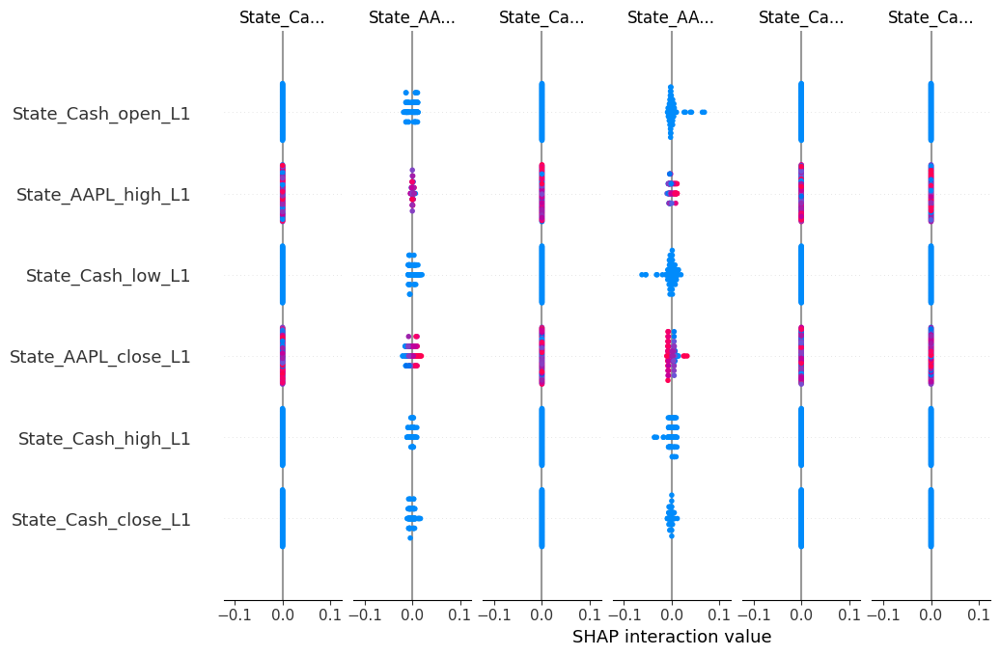

In [7]:
explainer = shap.TreeExplainer(best_rf_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# print shap_values shape
print("SHAP Values Shape:")
print(shap_values.shape)

# Plot the SHAP values
shap.summary_plot(shap_values, X_test)
plt.show()



In [9]:
shap.initjs()
shap.plots.force(explainer.expected_value[0], shap_values[..., 0])

In [6]:

# Detailed explanation for a single prediction
sample_index = 1

# shap feauture names
shap.initjs()
shap.plots.force(explainer.expected_value[sample_index], shap_values[..., sample_index],feature_names=X_test.columns, link='logit')

In [7]:

# Save in HTML
shap.save_html("shap.html", shap.plots.force(explainer.expected_value[sample_index], shap_values[..., sample_index],feature_names=X_test.columns, link='logit'))





In [8]:

# Save the plot in html format
shap.save_html("shap_plot.html", shap.plots.force(explainer.expected_value[sample_index], shap_values[..., sample_index],feature_names=X_test.columns, link='logit'))



## LIME

In [9]:
# Explain the model's predictions using LIME for the 6 output classes
import lime
import lime.lime_tabular

# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', feature_names=X_train.columns)

# Explain the model's predictions
sample_index = 1
explanation = explainer.explain_instance(X_test.values[sample_index], best_rf_model.predict,num_features=5, top_labels=6)
explanation.show_in_notebook()


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [10]:
# colums in y_train
action_columns = [col for col in df.columns if col.startswith('Action')]

# state columns
state_columns = [col for col in df.columns if col.startswith('State')]

#delet word state from the column names
state_columns = [col.replace('State_', '') for col in state_columns]

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', feature_names=state_columns)

# Choose a sample index to explain
sample_index = 60
instance = X_test.values[sample_index]


# Explain each output separately
for output_index in range(y_train.shape[1]):
    # Define a prediction function for the specific output
    def predict_fn(x):
        return best_rf_model.predict(x)[:, output_index]

    # Explain the instance for the specific output
    exp = explainer.explain_instance(instance, predict_fn, num_features=5)
    print(f"Explanation for output {action_columns[output_index]}:")
    exp.show_in_notebook(show_table=True)

c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_Cash:


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_AAPL:


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_ADBE:


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_BABA:


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_SNE:


c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Explanation for output Action_V:


In [11]:
import lime
import lime.lime_tabular

# Explain predictions using LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', feature_names=X_train.columns.tolist(), discretize_continuous=False)

# Explain the first sample as detailed as possible
sample_index = 50
exp = explainer.explain_instance(X_test.values[sample_index], best_rf_model.predict, num_features=5)
exp.show_in_notebook(show_table=True)



c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [12]:
# Find a sample index where lime values are not zero
sample_index = 25
exp = explainer.explain_instance(X_test.values[sample_index], best_rf_model.predict, num_features=5)
exp.show_in_notebook(show_table=True)






c:\Users\Ale\anaconda3\envs\business\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


## Feature Importance

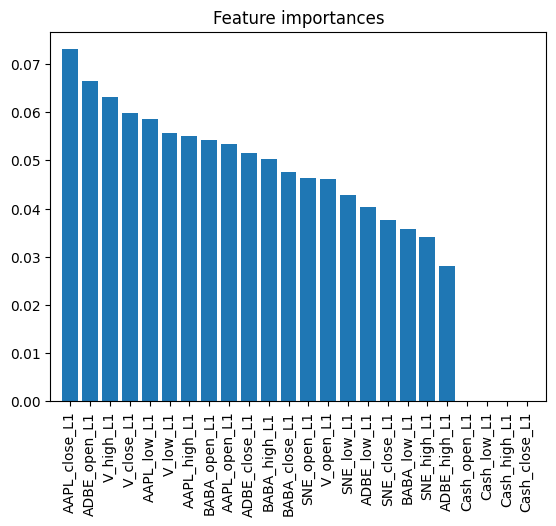

In [13]:
import numpy as np

# Feature importance
importances = best_rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Columns names
columns = X_train.columns
# Delete words 'State_' from columns names
columns = [col[6:] for col in columns]


# Plot the feature importances 
plt.figure()
plt.size = (200, 400)
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), np.array(columns)[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()


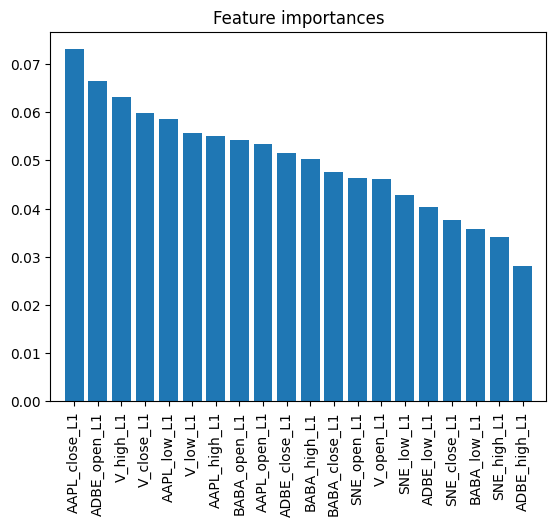

In [14]:

# Delete colums with zero importance
columns = np.array(columns)[indices]
importances = importances[indices]
columns = columns[importances > 0]
importances = importances[importances > 0]

# Plot the feature importances
plt.figure()
plt.size = (200, 400)
plt.title("Feature importances")
plt.bar(range(len(columns)), importances, align="center")
plt.xticks(range(len(columns)), columns, rotation=90)
plt.xlim([-1, len(columns)])
plt.show()


In [15]:
#Treshold=median of importances
threshold= np.median(importances)

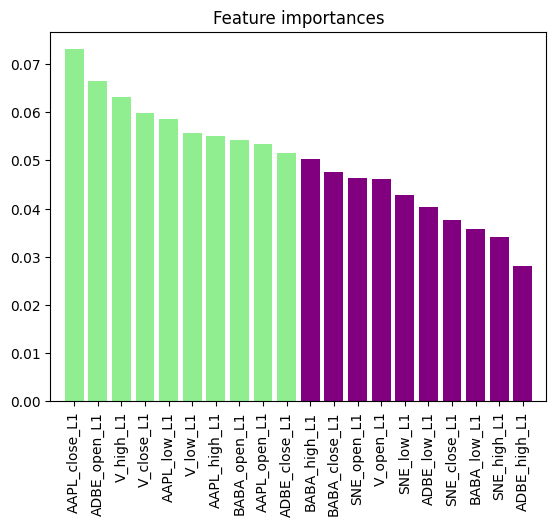

In [16]:

# Different colors for different importance levels
colors = ['lightgreen' if imp > threshold else 'purple' for imp in importances]

# Plot the feature importances
plt.figure()
plt.size = (200, 400)
plt.title("Feature importances")
plt.bar(range(len(columns)), importances, align="center", color=colors)
plt.xticks(range(len(columns)), columns, rotation=90)
plt.xlim([-1, len(columns)])
plt.show()


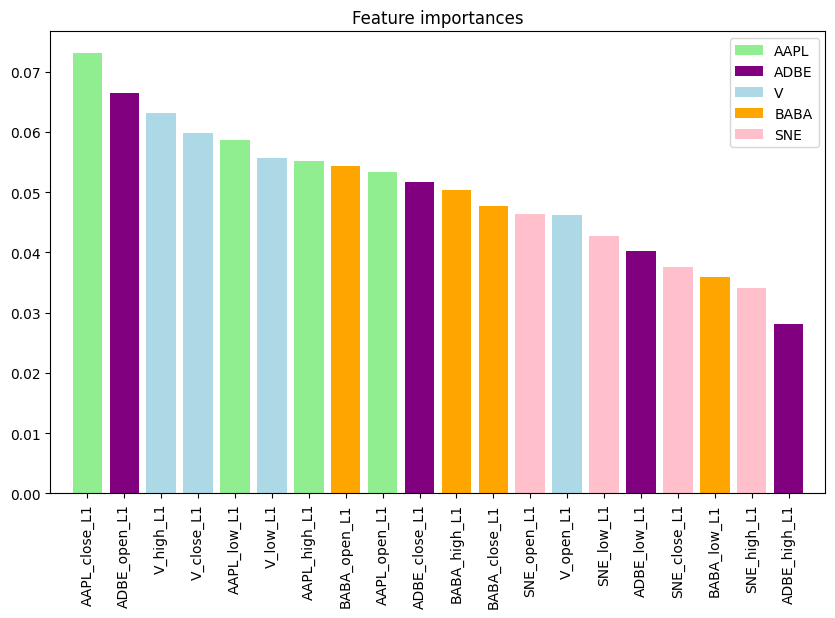

In [17]:

# Read tickers in data
# From columns take only tickers (first word before '_')
tickers = [col.split('_')[0] for col in columns]
# Get unique tickers
tickers = list(set(tickers))

# Create a list of colors for each ticker
colors = ['lightgreen', 'purple', 'lightblue', 'orange', 'pink', 'yellow', 'red', 'blue', 'green', 'brown', 'black', 'grey', 'cyan', 'magenta', 'olive', 'navy', 'lime', 'teal', 'aqua', 'maroon', 'fuchsia', 'purple', 'silver', 'gray', 'white']

# Create a dictionary with tickers as keys and colors as values
ticker_colors = dict(zip(tickers, colors))

# Plot the feature importances with different colors for each ticker
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
bars = plt.bar(range(len(columns)), importances, align="center", color=[ticker_colors[col.split('_')[0]] for col in columns])

# Create a proxy artist for the legend
from matplotlib.patches import Patch
legend_elements_tickers = [Patch(facecolor=ticker_colors[ticker], label=ticker) for ticker in tickers]

plt.legend(handles=legend_elements_tickers, loc='upper right')
plt.xticks(range(len(columns)), columns, rotation=90)
plt.xlim([-1, len(columns)])
plt.show()



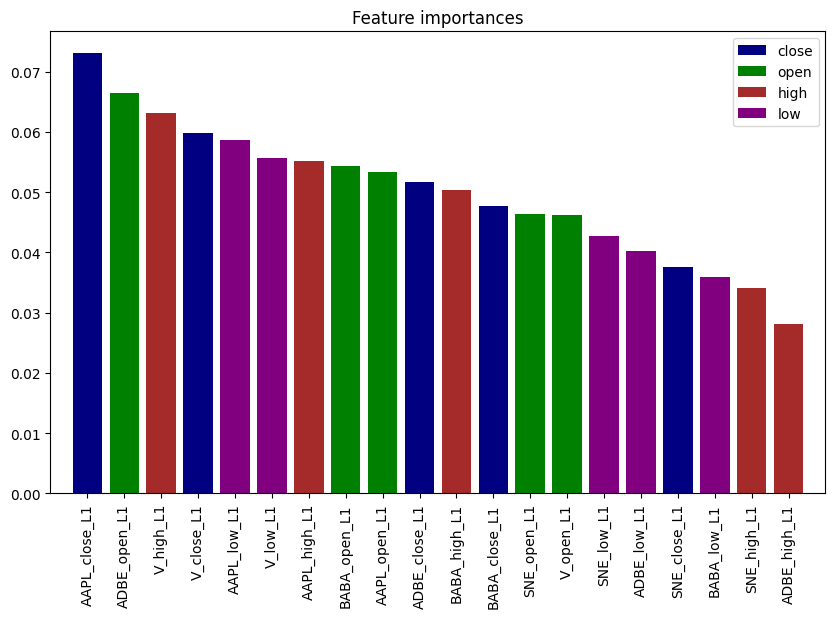

In [18]:
# Different colors for different values (close, open, high, low)
colors = ['navy', 'green', 'brown', 'purple']

# Create a dictionary with values as keys and colors as values
value_colors = dict(zip(['close', 'open', 'high', 'low'], colors))

# Plot the feature importances with different colors for each value
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
bars = plt.bar(range(len(columns)), importances, align="center", color=[value_colors[col.split('_')[1]] for col in columns])

# Create a proxy artist for the legend
legend_elements_values = [Patch(facecolor=value_colors[value], label=value) for value in ['close', 'open', 'high', 'low']]
plt.legend(handles=legend_elements_values, loc='upper right')
plt.xticks(range(len(columns)), columns, rotation=90)
plt.xlim([-1, len(columns)])
plt.show()

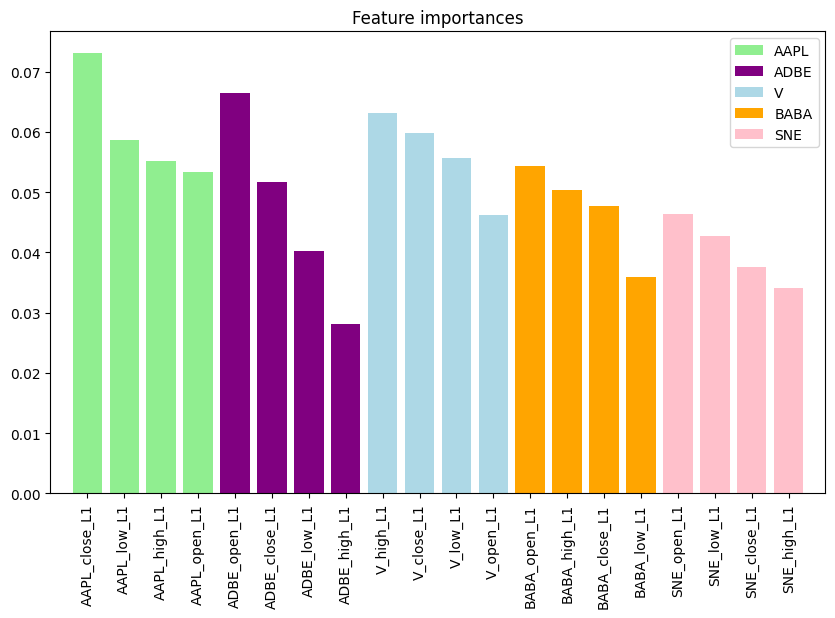

In [19]:
# Sort the feature importances by ticker
columns = np.array(columns)
importances = np.array(importances)
tickers = [col.split('_')[0] for col in columns]
tickers = list(set(tickers))
columns_sorted = []
importances_sorted = []
for ticker in tickers:
    mask = [ticker in col for col in columns]
    columns_sorted.extend(columns[mask])
    importances_sorted.extend(importances[mask])

# Plot the feature importances sorted by ticker
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
bars = plt.bar(range(len(columns_sorted)), importances_sorted, align="center", color=[ticker_colors[col.split('_')[0]] for col in columns_sorted])
plt.legend(handles=legend_elements_tickers, loc='upper right')
plt.xticks(range(len(columns_sorted)), columns_sorted, rotation=90)
plt.xlim([-1, len(columns_sorted)])
plt.show()

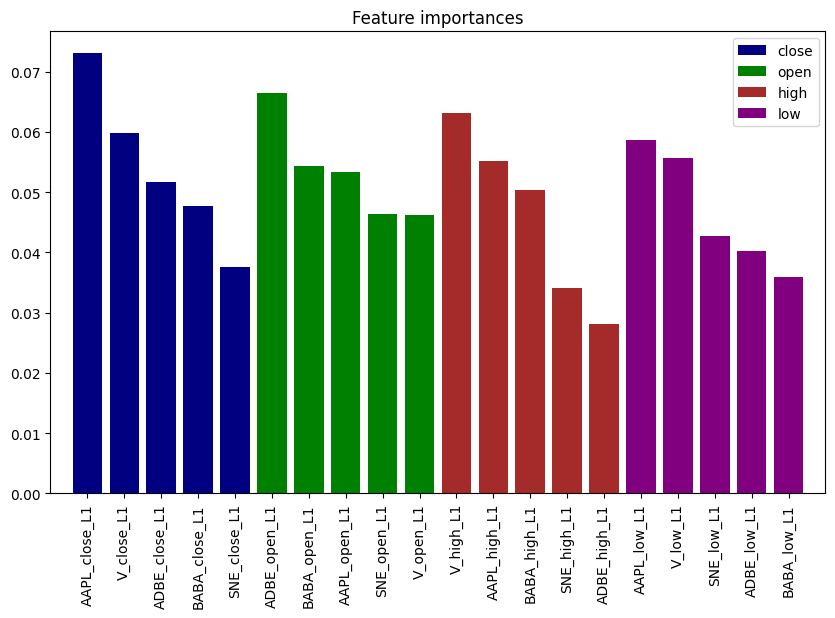

In [20]:
# Sort the feature importances by value (close, open, high, low)
columns_sorted = []
importances_sorted = []
for value in ['close', 'open', 'high', 'low']:
    mask = [value in col for col in columns]
    columns_sorted.extend(columns[mask])
    importances_sorted.extend(importances[mask])

# Plot the feature importances sorted by value
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
bars = plt.bar(range(len(columns_sorted)), importances_sorted, align="center", color=[value_colors[col.split('_')[1]] for col in columns_sorted])
plt.legend(handles=legend_elements_values, loc='upper right')
plt.xticks(range(len(columns_sorted)), columns_sorted, rotation=90)
plt.xlim([-1, len(columns_sorted)])
plt.show()

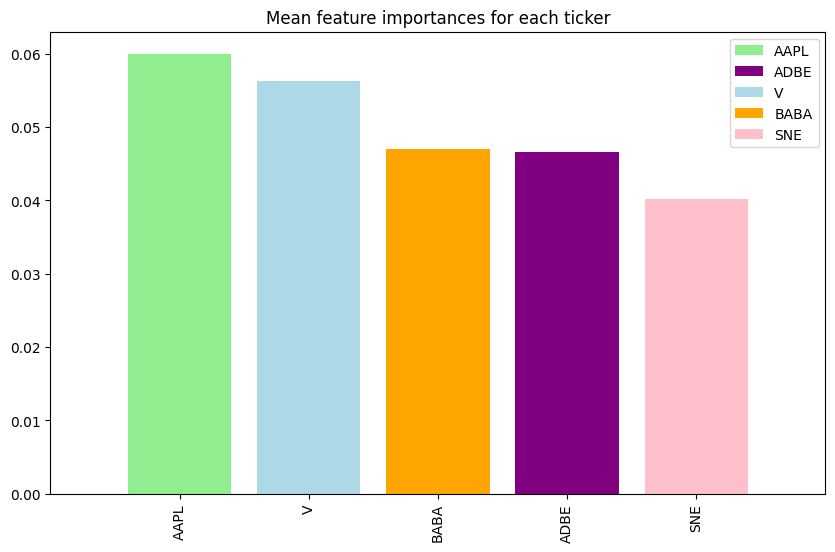

In [21]:
# Plit the mean importances for each ticker
mean_importances = []
for ticker in tickers:
    mask = [ticker in col for col in columns]
    mean_importances.append(np.mean(importances[mask]))

# Sort the mean importances
indices = np.argsort(mean_importances)[::-1]
tickers_sorted = np.array(tickers)[indices]
mean_importances_sorted = np.array(mean_importances)[indices]

# Plot the mean importances for each ticker
plt.figure(figsize=(10, 6))
plt.title("Mean feature importances for each ticker")
bars = plt.bar(range(len(tickers_sorted)), mean_importances_sorted, align="center", color=[ticker_colors[ticker] for ticker in tickers_sorted])
plt.legend(handles=legend_elements_tickers, loc='upper right')
plt.xticks(range(len(tickers_sorted)), tickers_sorted, rotation=90)
plt.xlim([-1, len(tickers_sorted)])
plt.show()


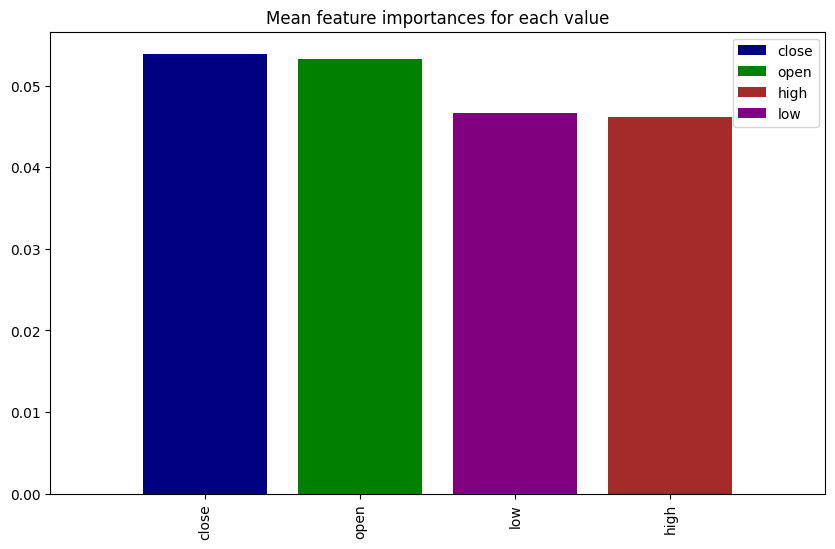

In [22]:
# Plot the mean importances for each value
mean_importances = []
for value in ['close', 'open', 'high', 'low']:
    mask = [value in col for col in columns]
    mean_importances.append(np.mean(importances[mask]))

# Sort the mean importances
indices = np.argsort(mean_importances)[::-1]
values_sorted = ['close', 'open', 'high', 'low']
values_sorted = np.array(values_sorted)[indices]
mean_importances_sorted = np.array(mean_importances)[indices]

# Plot the mean importances for each value
plt.figure(figsize=(10, 6))
plt.title("Mean feature importances for each value")
bars = plt.bar(range(len(values_sorted)), mean_importances_sorted, align="center", color=[value_colors[value] for value in values_sorted])
plt.legend(handles=legend_elements_values, loc='upper right')
plt.xticks(range(len(values_sorted)), values_sorted, rotation=90)
plt.xlim([-1, len(values_sorted)])
plt.show()